In [1]:
import os
import pandas as pd
import numpy as np
import glob
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from statsmodels.tsa.stattools import ccf

In [2]:
# Leitura do dataframe do resample de 5 minutos todos os dias
caminho_arquivos_pkl_29_01_and_20_05 = r'H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida\Arquivos_correlacao_Excel\resample_5_minutos.pkl'
df_resample_5_min = pd.read_pickle(caminho_arquivos_pkl_29_01_and_20_05)

In [3]:
df_resample_5_min# Filtrar os dados para excluir o dia 20 de maio
df_resample_5_min = df_resample_5_min[df_resample_5_min.index.date != pd.to_datetime('2024-05-20').date()]

### CONSTRUÇÃO DOS GRÁFICOS DIARIOS DA POTENCIA GERADA COM AS OUTRAS VARIÁVEIS

In [ ]:
# Lista das colunas de interesse
columns_of_interest = ['G2_Gerador_Potência',
    'G2_Oleo_Motor_Temp', 'G2_Oleo_Motor_Press',
    'G2_Carga_Temperature', 'G2_Aumento_Pressão_Valvula_Real',
    'G2_Gerador_Corrente_Média', 'G2_Gerador_Tensão_Média',
    'G2_Gerador_Potência_Reativa', 'G2_Gerador_Potência_Aparente',
    'G2_Gerador_frequencia', 'G2_Gerador_Fator_de_Potência',
    'G2_Acelerador_Valv_Posição', 'G2_Jacket_Water_pressão',
    'G2_Jacket_Water_Temp', 'G2_Cilindro_EX_GAS_TEMP_Média',
    'g2_Turbocharger_Bypass_Posição', 'G2_Saída_Ativa_total',
    'G2_Saída_Reativa_total', 'G2_LAMBDA_TECJET', 'G2_Gerador_Corrente_L1',
    'G2_Gerador_Voltagem_L1_N', 'G2_Gerador_enrolamento_temp_L1',
    'G2_Gerador_enrolamento_temp_L2', 'G2_Gerador_enrolamento_temp_L3',
    'G2_Gerador_Extremidade_acionamento_rolamento',
    'G2_Gerador_Bearing_nondriveend', 'G2_Gerador_Corrente_L2',
    'G2_Gerador_Voltagem_L2_L3', 'G2_Gerador_Voltagem_L2_N',
    'G2_Gerador_Corrente_N', 'G2_Excitação_Voltagem',
    'G2_Gerador_Corrente_L3', 'G2_Gerador_Voltagem_L3_L1',
    'G2_Gerador_Voltagem_L3_N'
]

# Calcular o mínimo dos mínimos e o máximo dos máximos para cada variável ao longo de todos os dias
minimos = df_resample_5_min.min() - 50
maximos = df_resample_5_min.max() + 50

# Diretório para salvar os gráficos
output_dir = r'H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida\Arquivos_correlacao_Excel\graficos_diarios'

# Iterar sobre cada coluna de interesse
for column in columns_of_interest:
    # Iterar sobre cada dia
    for date in df_resample_5_min.index.floor('D').unique():
        # Filtrar o DataFrame para os dados do dia atual
        df_dia = df_resample_5_min.loc[date:date + pd.Timedelta(days=1)]

        # Criar a figura e os eixos
        fig, ax1 = plt.subplots(figsize=(20, 5))

        # Plotar a potência gerada no eixo yy do lado esquerdo
        ax1.plot(df_dia.index, df_dia['G2_Gerador_Potência'], label='Potência Gerada', linestyle='-', color='blue')
        ax1.set_ylabel('Potência Gerada', color='blue')
        ax1.tick_params(axis='y', labelcolor='blue')
        ax1.yaxis.label.set_color('blue')

        # Plotar a variável no eixo yy do lado direito
        ax2 = ax1.twinx()
        ax2.plot(df_dia.index, df_dia[column], label=f'{column}', color='red')
        ax2.set_ylabel('Média', color='red')
        ax2.tick_params(axis='y', labelcolor='red')
        ax2.yaxis.label.set_color('red')

        # Adicionar título e legenda
        dia_semana = date.strftime("%A")  # Obter o dia da semana
        plt.title(f'Variação diária de {column} e Potência Gerada para o dia {date.strftime("%d/%m/%Y")} ({dia_semana})')
        ax1.legend(loc='upper left')
        ax2.legend(loc='upper right')

        # Definir limites dos eixos
        ax1.set_ylim(minimos['G2_Gerador_Potência'], maximos['G2_Gerador_Potência'])
        ax2.set_ylim(minimos[column], maximos[column])

        # Formatar ticks do eixo x
        plt.xticks(rotation=45)
        ax1.xaxis.set_major_locator(mdates.HourLocator(interval=1))
        ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Hh%M'))

        # Adicionar grid na vertical a cada hora
        ax1.grid(True, which='major', axis='x', linestyle='--', linewidth=0.5)
        
        # Salvar a figura com o nome igual ao título
        filename = f"{output_dir}/{column}_{date.strftime('%Y-%m-%d')}.jpg"
        plt.savefig(filename, format='jpg')

### NORMALIZAR OS VALORES MÁXIMOS DE CADA VARIÁVEL PARA REPRESENTAR O PADRÃO REGULAR E IRREGULAR

In [11]:
# Calcular o valor máximo de cada variável
max_values = df_resample_5_min.max()

# Lista das colunas de interesse
variables_to_divide = ['G2_Gerador_Potência',
    'G2_Oleo_Motor_Temp', 'G2_Oleo_Motor_Press',
    'G2_Carga_Temperature', 'G2_Aumento_Pressão_Valvula_Real',
    'G2_Gerador_Corrente_Média', 'G2_Gerador_Tensão_Média',
    'G2_Gerador_Potência_Reativa', 'G2_Gerador_Potência_Aparente',
    'G2_Gerador_frequencia', 'G2_Gerador_Fator_de_Potência',
    'G2_Acelerador_Valv_Posição', 'G2_Jacket_Water_pressão',
    'G2_Jacket_Water_Temp', 'G2_Cilindro_EX_GAS_TEMP_Média',
    'g2_Turbocharger_Bypass_Posição', 'G2_Saída_Ativa_total',
    'G2_Saída_Reativa_total', 'G2_LAMBDA_TECJET', 'G2_Gerador_Corrente_L1',
    'G2_Gerador_Voltagem_L1_N', 'G2_Gerador_enrolamento_temp_L1',
    'G2_Gerador_enrolamento_temp_L2', 'G2_Gerador_enrolamento_temp_L3',
    'G2_Gerador_Extremidade_acionamento_rolamento',
    'G2_Gerador_Bearing_nondriveend', 'G2_Gerador_Corrente_L2',
    'G2_Gerador_Voltagem_L2_L3', 'G2_Gerador_Voltagem_L2_N',
    'G2_Gerador_Corrente_N', 'G2_Excitação_Voltagem',
    'G2_Gerador_Corrente_L3', 'G2_Gerador_Voltagem_L3_L1',
    'G2_Gerador_Voltagem_L3_N'
]

# Dividir os valores das variáveis pelo seu valor máximo
df_resample_5_min[variables_to_divide] = df_resample_5_min[variables_to_divide].div(max_values[variables_to_divide])

### PADRÃO NORMAL

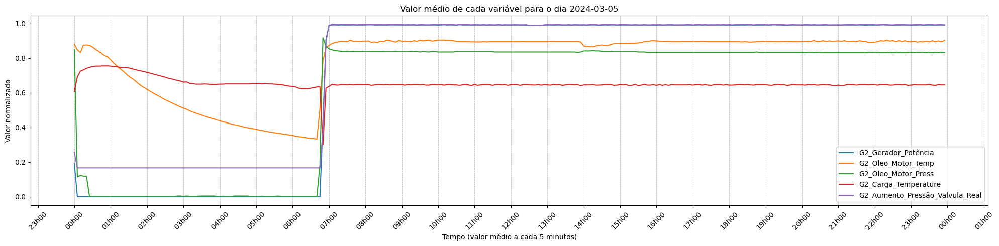

Gráfico salvo em: H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida\Variação_variáveis_2024-03-05.png


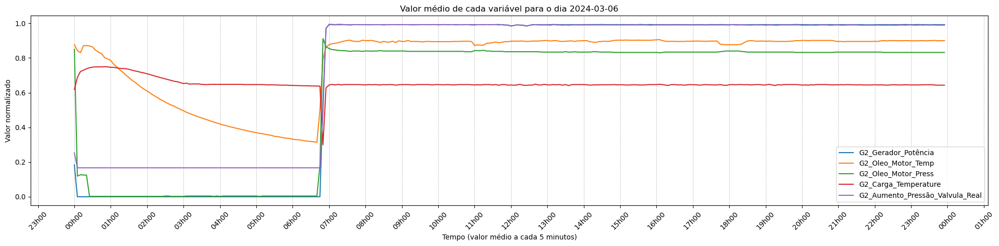

Gráfico salvo em: H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida\Variação_variáveis_2024-03-06.png


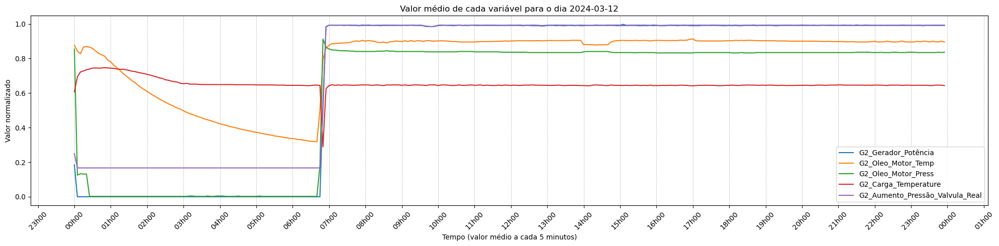

Gráfico salvo em: H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida\Variação_variáveis_2024-03-12.png


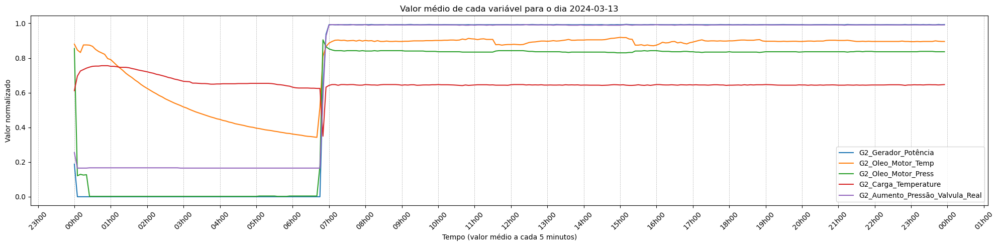

Gráfico salvo em: H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida\Variação_variáveis_2024-03-13.png


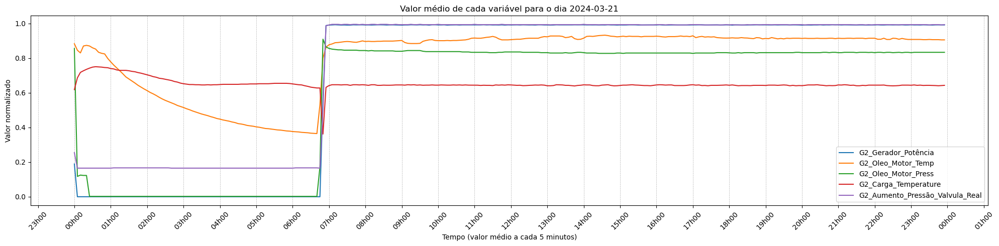

Gráfico salvo em: H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida\Variação_variáveis_2024-03-21.png


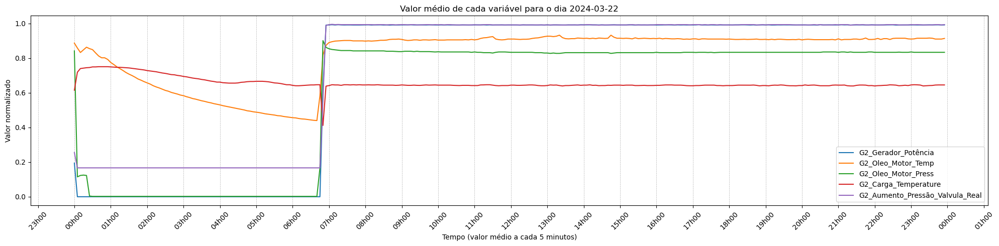

Gráfico salvo em: H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida\Variação_variáveis_2024-03-22.png


In [16]:
# Lista das datas de interesse
dates_of_interest = ['2024-03-05', '2024-03-06', '2024-03-12', '2024-03-13', '2024-03-21', '2024-03-22']

# Lista das colunas de interesse
columns_of_interest = ['G2_Gerador_Potência', 'G2_Oleo_Motor_Temp', 'G2_Oleo_Motor_Press', 'G2_Carga_Temperature', 'G2_Aumento_Pressão_Valvula_Real']

# Diretório para salvar os gráficos
caminho_diretorio = r'H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida'

# Iterar sobre cada data de interesse
for date in dates_of_interest:
    # Filtrar o DataFrame para os dados do dia específico
    df_dia_especifico = df_resample_5_min.loc[date]

    # Criar a figura e os eixos
    fig, ax1 = plt.subplots(figsize=(20, 5))

    # Plotar as variáveis no mesmo eixo y
    for column in columns_of_interest:
        ax1.plot(df_dia_especifico.index, df_dia_especifico[column], label=column)

    # Adicionar título e legenda
    plt.title(f'Valor médio de cada variável para o dia {date}')
    ax1.legend(loc='lower right')

    # Definir rótulos dos eixos
    ax1.set_xlabel('Tempo (valor médio a cada 5 minutos)')
    ax1.set_ylabel('Valor normalizado')
    
    # Formatar ticks do eixo x
    plt.xticks(rotation=45)
    ax1.xaxis.set_major_locator(mdates.HourLocator(interval=1))
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Hh%M'))

    # Adicionar grid na vertical a cada hora
    ax1.grid(True, which='major', axis='x', linestyle='--', linewidth=0.5)

    # Ajustar o layout para melhor visualização
    plt.tight_layout()

    # Caminho para salvar o arquivo gráfico
    caminho_grafico = f'{caminho_diretorio}\\Variação_variáveis_{date}.png'

    # Salvar o gráfico na melhor resolução possível (dpi = 300)
    plt.savefig(caminho_grafico, dpi=300)

    # Exibir o gráfico
    plt.show()

    print(f"Gráfico salvo em: {caminho_grafico}")

### PADRÃO ANORMAL

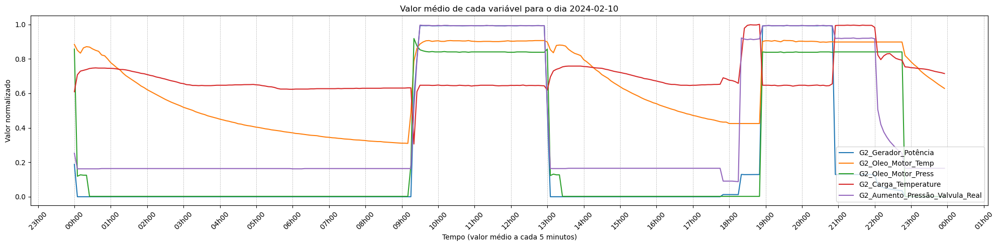

Gráfico salvo em: H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida\Variação_variáveis_2024-02-10.png


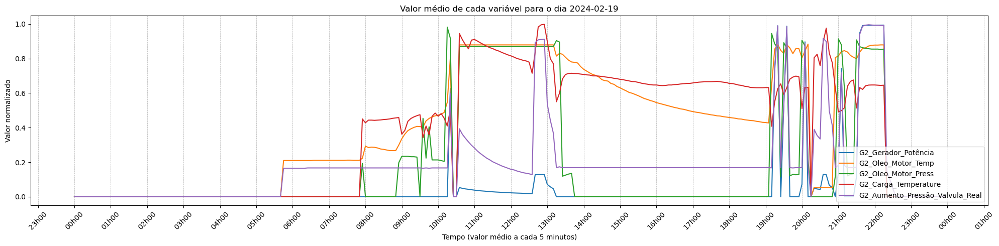

Gráfico salvo em: H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida\Variação_variáveis_2024-02-19.png


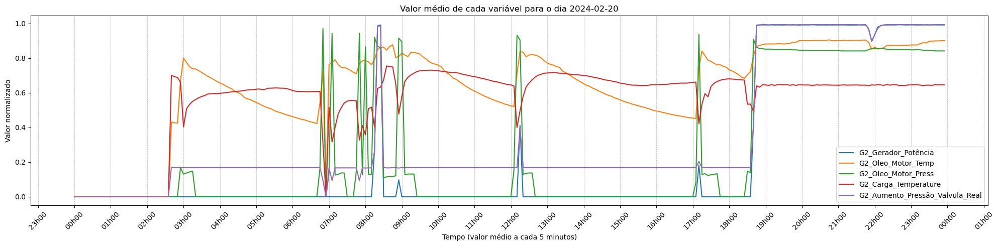

Gráfico salvo em: H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida\Variação_variáveis_2024-02-20.png


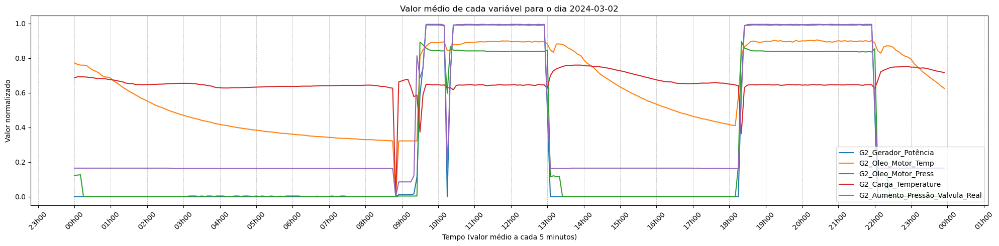

Gráfico salvo em: H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida\Variação_variáveis_2024-03-02.png


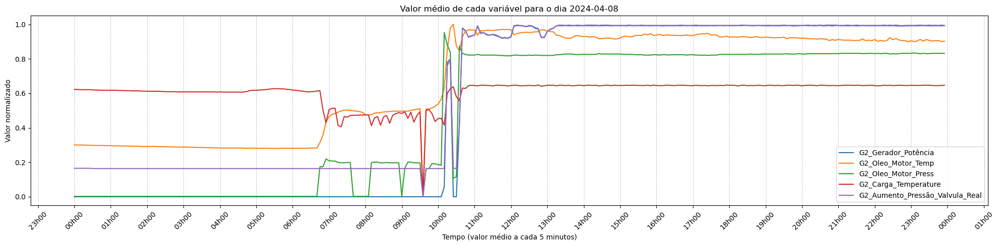

Gráfico salvo em: H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida\Variação_variáveis_2024-04-08.png


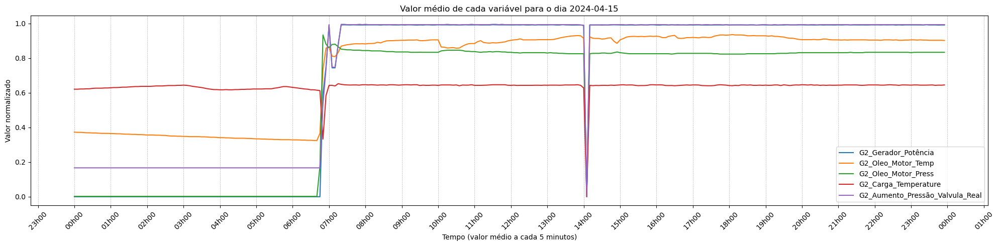

Gráfico salvo em: H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida\Variação_variáveis_2024-04-15.png


In [17]:
# Lista das datas de interesse
dates_of_interest = ['2024-02-10', '2024-02-19', '2024-02-20', '2024-03-02', '2024-04-08', '2024-04-15']

# Lista das colunas de interesse
columns_of_interest = ['G2_Gerador_Potência', 'G2_Oleo_Motor_Temp', 'G2_Oleo_Motor_Press',
    'G2_Carga_Temperature', 'G2_Aumento_Pressão_Valvula_Real']

# Diretório para salvar os gráficos
caminho_diretorio = r'H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida'

# Iterar sobre cada data de interesse
for date in dates_of_interest:
    # Filtrar o DataFrame para os dados do dia específico
    df_dia_especifico = df_resample_5_min.loc[date]

    # Criar a figura e os eixos
    fig, ax1 = plt.subplots(figsize=(20, 5))

    # Plotar as variáveis no mesmo eixo y
    for column in columns_of_interest:
        ax1.plot(df_dia_especifico.index, df_dia_especifico[column], label=column)

    # Adicionar título e legenda
    plt.title(f'Valor médio de cada variável para o dia {date}')
    ax1.legend(loc='lower right')

    # Definir rótulos dos eixos
    ax1.set_xlabel('Tempo (valor médio a cada 5 minutos)')
    ax1.set_ylabel('Valor normalizado')
    
    # Formatar ticks do eixo x
    plt.xticks(rotation=45)
    ax1.xaxis.set_major_locator(mdates.HourLocator(interval=1))
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Hh%M'))

    # Adicionar grid na vertical a cada hora
    ax1.grid(True, which='major', axis='x', linestyle='--', linewidth=0.5)

    # Ajustar o layout para melhor visualização
    plt.tight_layout()

    # Caminho para salvar o arquivo gráfico
    caminho_grafico = f'{caminho_diretorio}\\Variação_variáveis_{date}.png'

    # Salvar o gráfico na melhor resolução possível (dpi = 300)
    plt.savefig(caminho_grafico, dpi=300)

    # Exibir o gráfico
    plt.show()

    print(f"Gráfico salvo em: {caminho_grafico}")

### PADRÃO NORMAL

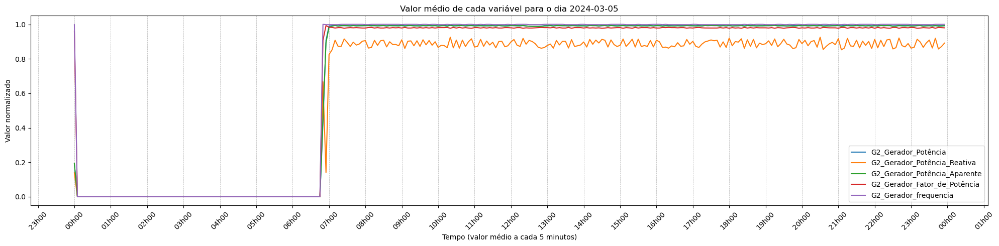

Gráfico salvo em: H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida\Variação_variáveis_PTENCIAS_2024-03-05.png


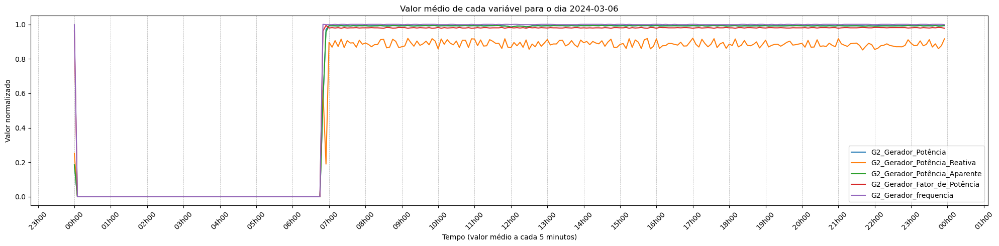

Gráfico salvo em: H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida\Variação_variáveis_PTENCIAS_2024-03-06.png


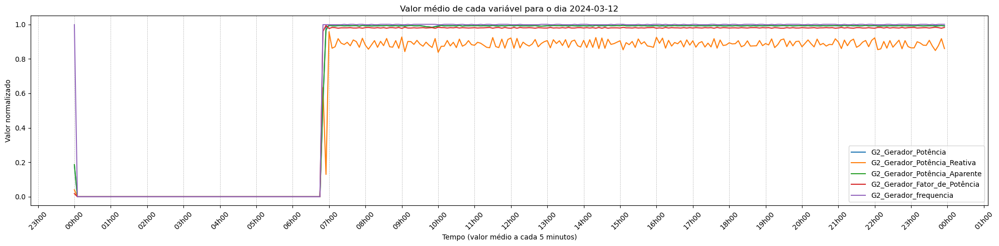

Gráfico salvo em: H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida\Variação_variáveis_PTENCIAS_2024-03-12.png


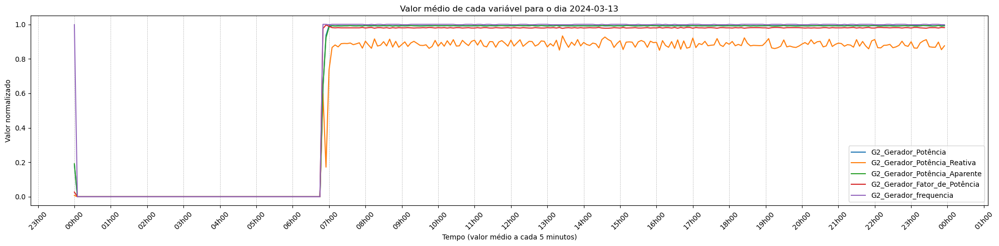

Gráfico salvo em: H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida\Variação_variáveis_PTENCIAS_2024-03-13.png


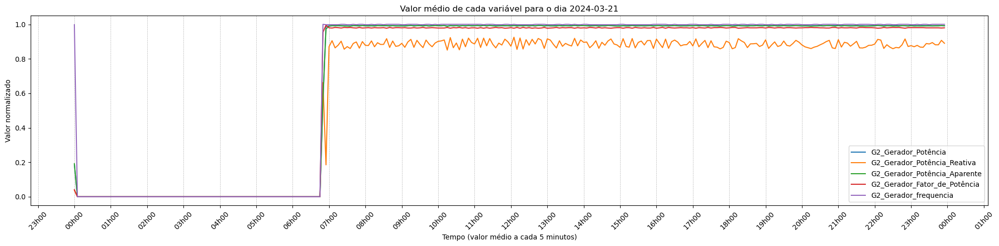

Gráfico salvo em: H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida\Variação_variáveis_PTENCIAS_2024-03-21.png


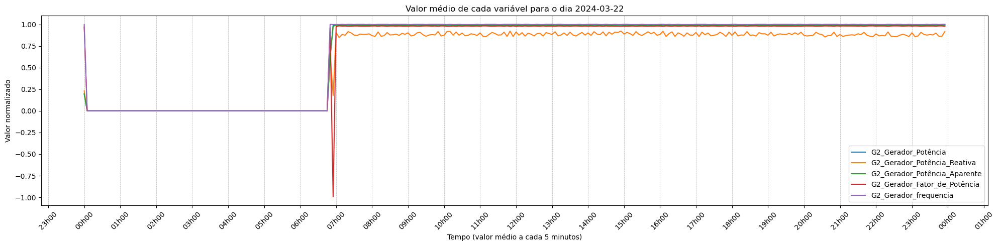

Gráfico salvo em: H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida\Variação_variáveis_PTENCIAS_2024-03-22.png


In [18]:
# Lista das datas de interesse
dates_of_interest = ['2024-03-05', '2024-03-06', '2024-03-12', '2024-03-13', '2024-03-21', '2024-03-22']

# Lista das colunas de interesse
columns_of_interest = ['G2_Gerador_Potência', 'G2_Gerador_Potência_Reativa', 'G2_Gerador_Potência_Aparente', 'G2_Gerador_Fator_de_Potência', 'G2_Gerador_frequencia']

# Diretório para salvar os gráficos
caminho_diretorio = r'H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida'

# Iterar sobre cada data de interesse
for date in dates_of_interest:
    # Filtrar o DataFrame para os dados do dia específico
    df_dia_especifico = df_resample_5_min.loc[date]

    # Criar a figura e os eixos
    fig, ax1 = plt.subplots(figsize=(20, 5))

    # Plotar as variáveis no mesmo eixo y
    for column in columns_of_interest:
        ax1.plot(df_dia_especifico.index, df_dia_especifico[column], label=column)

    # Adicionar título e legenda
    plt.title(f'Valor médio de cada variável para o dia {date}')
    ax1.legend(loc='lower right')

    # Definir rótulos dos eixos
    ax1.set_xlabel('Tempo (valor médio a cada 5 minutos)')
    ax1.set_ylabel('Valor normalizado')
    
    # Formatar ticks do eixo x
    plt.xticks(rotation=45)
    ax1.xaxis.set_major_locator(mdates.HourLocator(interval=1))
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Hh%M'))

    # Adicionar grid na vertical a cada hora
    ax1.grid(True, which='major', axis='x', linestyle='--', linewidth=0.5)

    # Ajustar o layout para melhor visualização
    plt.tight_layout()

    # Caminho para salvar o arquivo gráfico
    caminho_grafico = f'{caminho_diretorio}\\Variação_variáveis_PTENCIAS_{date}.png'

    # Salvar o gráfico na melhor resolução possível (dpi = 300)
    plt.savefig(caminho_grafico, dpi=300)

    # Exibir o gráfico
    plt.show()

    print(f"Gráfico salvo em: {caminho_grafico}")

### PADRÃO ANORMAL

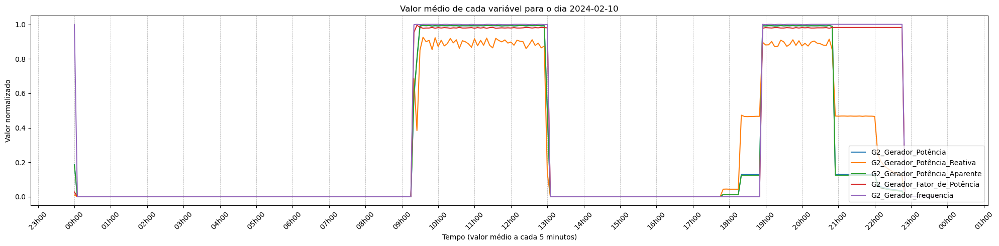

Gráfico salvo em: H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida\Variação_variáveis_POTENCIAS_2024-02-10.png


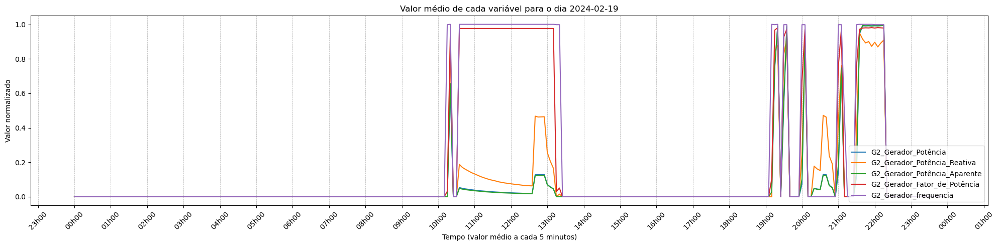

Gráfico salvo em: H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida\Variação_variáveis_POTENCIAS_2024-02-19.png


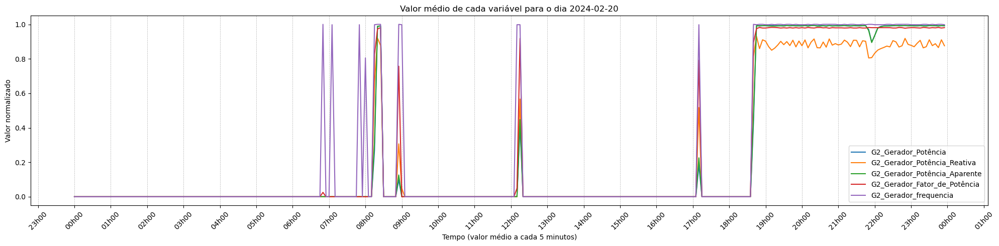

Gráfico salvo em: H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida\Variação_variáveis_POTENCIAS_2024-02-20.png


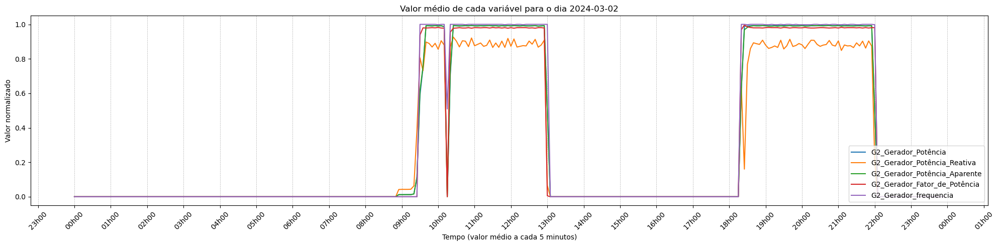

Gráfico salvo em: H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida\Variação_variáveis_POTENCIAS_2024-03-02.png


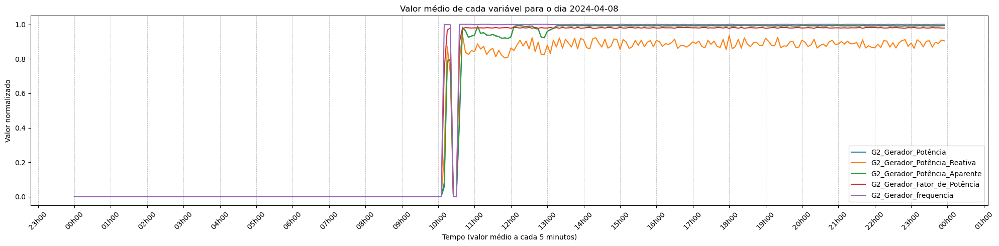

Gráfico salvo em: H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida\Variação_variáveis_POTENCIAS_2024-04-08.png


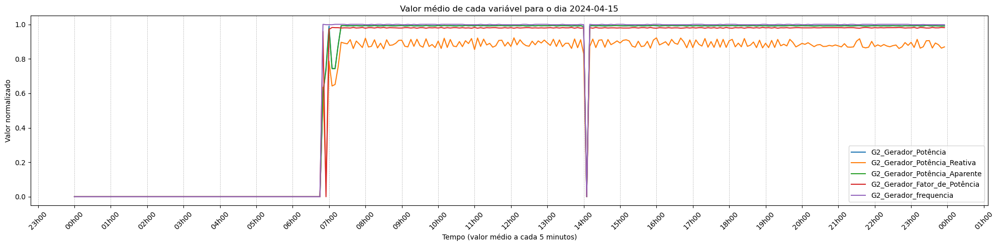

Gráfico salvo em: H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida\Variação_variáveis_POTENCIAS_2024-04-15.png


In [19]:
# Lista das datas de interesse
dates_of_interest = ['2024-02-10', '2024-02-19', '2024-02-20', '2024-03-02', '2024-04-08', '2024-04-15']

# Lista das colunas de interesse
columns_of_interest = ['G2_Gerador_Potência', 'G2_Gerador_Potência_Reativa', 'G2_Gerador_Potência_Aparente', 'G2_Gerador_Fator_de_Potência', 'G2_Gerador_frequencia']

# Diretório para salvar os gráficos
caminho_diretorio = r'H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida'

# Iterar sobre cada data de interesse
for date in dates_of_interest:
    # Filtrar o DataFrame para os dados do dia específico
    df_dia_especifico = df_resample_5_min.loc[date]

    # Criar a figura e os eixos
    fig, ax1 = plt.subplots(figsize=(20, 5))

    # Plotar as variáveis no mesmo eixo y
    for column in columns_of_interest:
        ax1.plot(df_dia_especifico.index, df_dia_especifico[column], label=column)

    # Adicionar título e legenda
    plt.title(f'Valor médio de cada variável para o dia {date}')
    ax1.legend(loc='lower right')

    # Definir rótulos dos eixos
    ax1.set_xlabel('Tempo (valor médio a cada 5 minutos)')
    ax1.set_ylabel('Valor normalizado')
    
    # Formatar ticks do eixo x
    plt.xticks(rotation=45)
    ax1.xaxis.set_major_locator(mdates.HourLocator(interval=1))
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Hh%M'))

    # Adicionar grid na vertical a cada hora
    ax1.grid(True, which='major', axis='x', linestyle='--', linewidth=0.5)

    # Ajustar o layout para melhor visualização
    plt.tight_layout()

    # Caminho para salvar o arquivo gráfico
    caminho_grafico = f'{caminho_diretorio}\\Variação_variáveis_POTENCIAS_{date}.png'

    # Salvar o gráfico na melhor resolução possível (dpi = 300)
    plt.savefig(caminho_grafico, dpi=300)

    # Exibir o gráfico
    plt.show()

    print(f"Gráfico salvo em: {caminho_grafico}")

### PADRÃO NORMAL

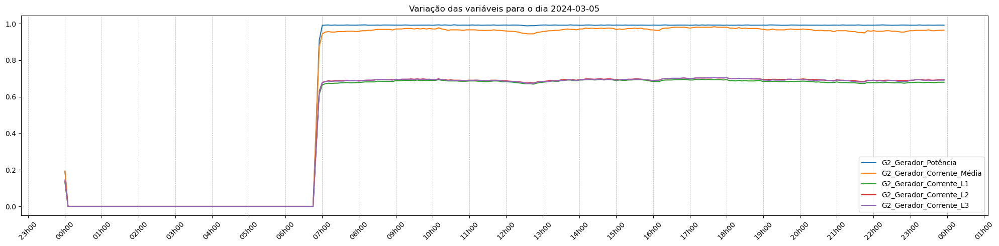

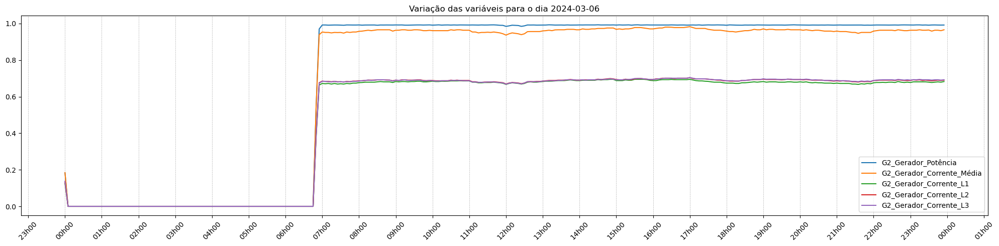

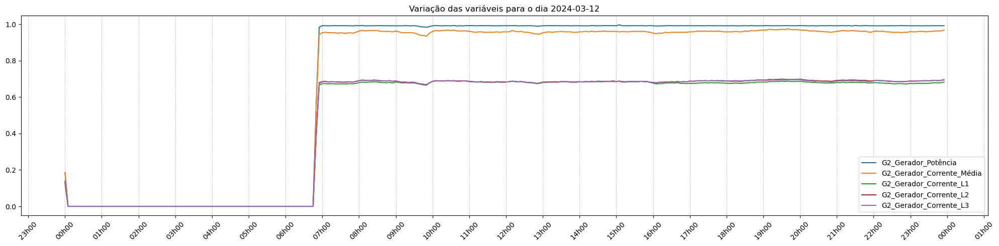

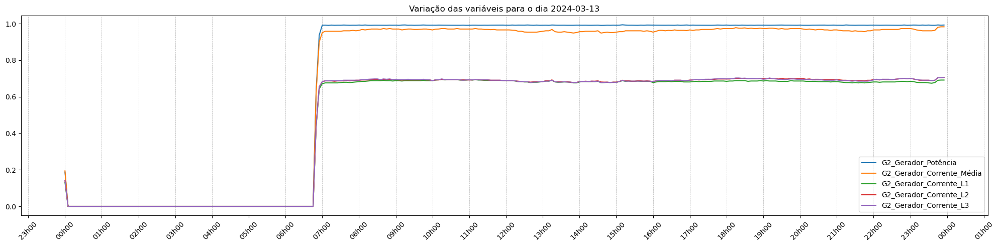

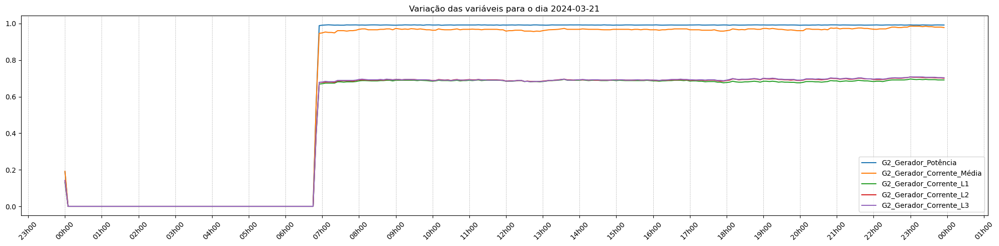

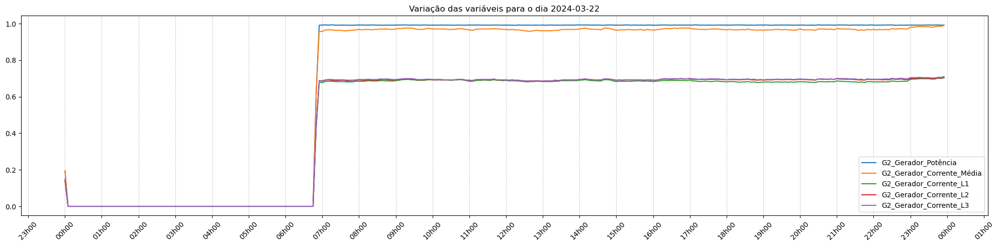

In [38]:
# Lista das datas de interesse
dates_of_interest = ['2024-03-05', '2024-03-06', '2024-03-12', '2024-03-13', '2024-03-21', '2024-03-22']

# Lista das colunas de interesse
columns_of_interest = ['G2_Gerador_Potência', 'G2_Gerador_Corrente_Média', 'G2_Gerador_Corrente_L1', 'G2_Gerador_Corrente_L2', 'G2_Gerador_Corrente_L3']

# Iterar sobre cada data de interesse
for date in dates_of_interest:
    # Filtrar o DataFrame para os dados do dia específico
    df_dia_especifico = df_resample_5_min.loc[date]

    # Criar a figura e os eixos
    fig, ax1 = plt.subplots(figsize=(20, 5))

    # Plotar as variáveis no mesmo eixo y
    for column in columns_of_interest:
        ax1.plot(df_dia_especifico.index, df_dia_especifico[column], label=column)

    # Adicionar título e legenda
    plt.title(f'Variação das variáveis para o dia {date}')
    ax1.legend(loc='lower right')

    # Formatar ticks do eixo x
    plt.xticks(rotation=45)
    ax1.xaxis.set_major_locator(mdates.HourLocator(interval=1))
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Hh%M'))

    # Adicionar grid na vertical a cada hora
    ax1.grid(True, which='major', axis='x', linestyle='--', linewidth=0.5)

    # Exibir o gráfico
    plt.tight_layout()
    plt.show()

### PADRÃO ANORMAL

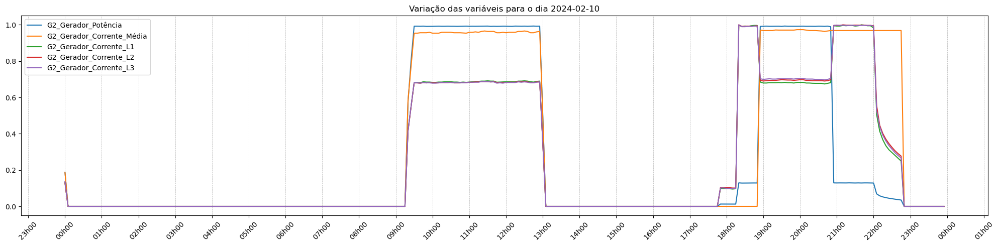

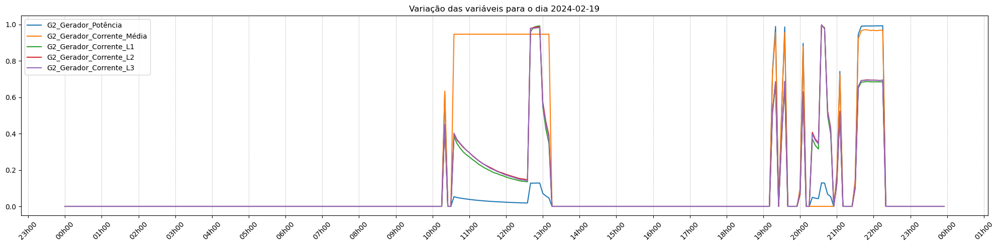

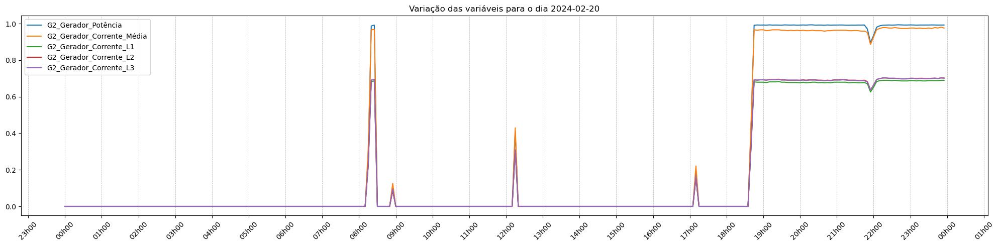

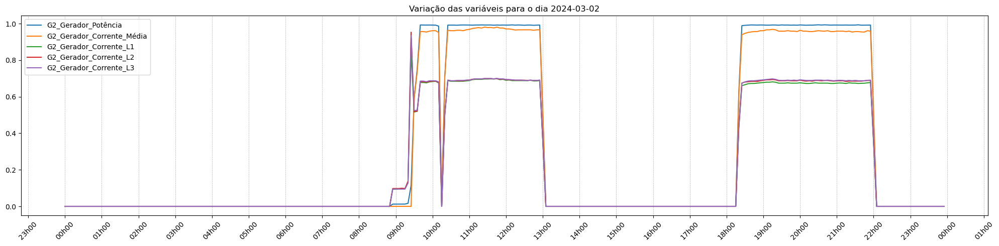

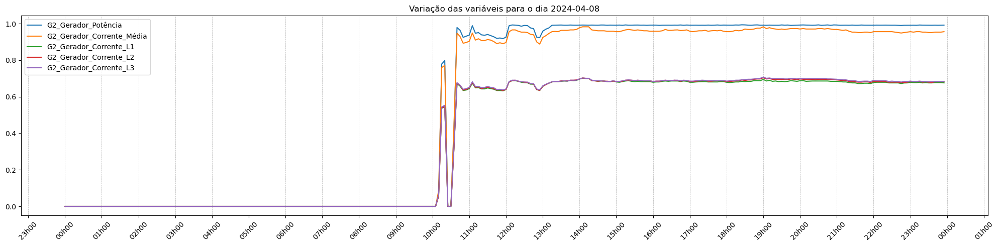

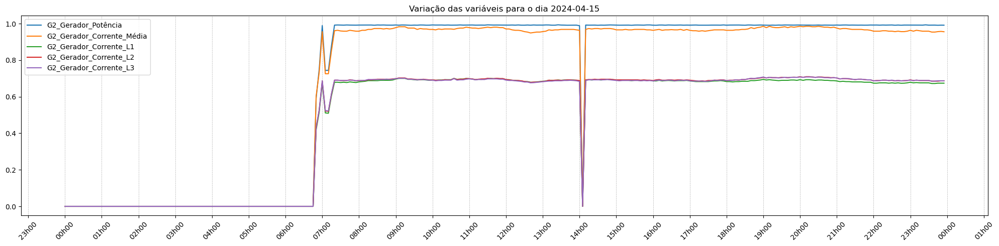

In [39]:
# Lista das datas de interesse
dates_of_interest = ['2024-02-10', '2024-02-19', '2024-02-20', '2024-03-02', '2024-04-08', '2024-04-15']

# Lista das colunas de interesse
columns_of_interest = ['G2_Gerador_Potência', 'G2_Gerador_Corrente_Média', 'G2_Gerador_Corrente_L1', 'G2_Gerador_Corrente_L2', 'G2_Gerador_Corrente_L3']

# Iterar sobre cada data de interesse
for date in dates_of_interest:
    # Filtrar o DataFrame para os dados do dia específico
    df_dia_especifico = df_resample_5_min.loc[date]

    # Criar a figura e os eixos
    fig, ax1 = plt.subplots(figsize=(20, 5))

    # Plotar as variáveis no mesmo eixo y
    for column in columns_of_interest:
        ax1.plot(df_dia_especifico.index, df_dia_especifico[column], label=column)

    # Adicionar título e legenda
    plt.title(f'Variação das variáveis para o dia {date}')
    ax1.legend(loc='upper left')

    # Formatar ticks do eixo x
    plt.xticks(rotation=45)
    ax1.xaxis.set_major_locator(mdates.HourLocator(interval=1))
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Hh%M'))

    # Adicionar grid na vertical a cada hora
    ax1.grid(True, which='major', axis='x', linestyle='--', linewidth=0.5)

    # Exibir o gráfico
    plt.tight_layout()
    plt.show()

### PADRÃO NORMAL

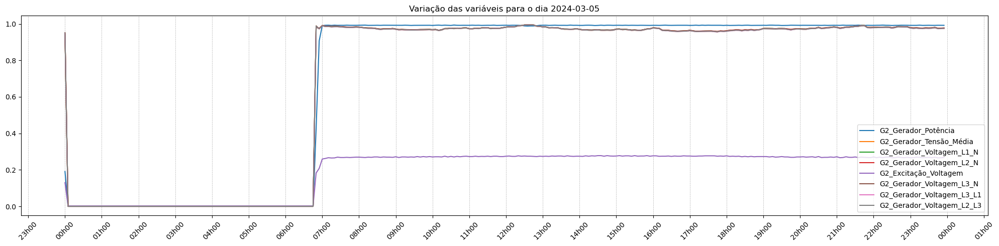

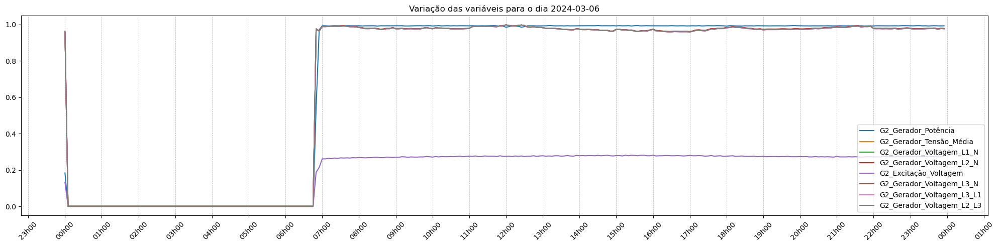

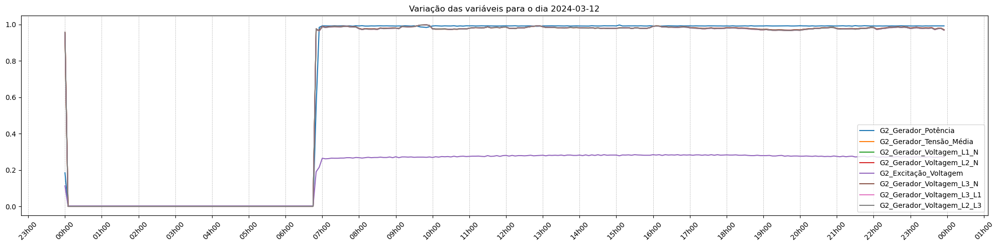

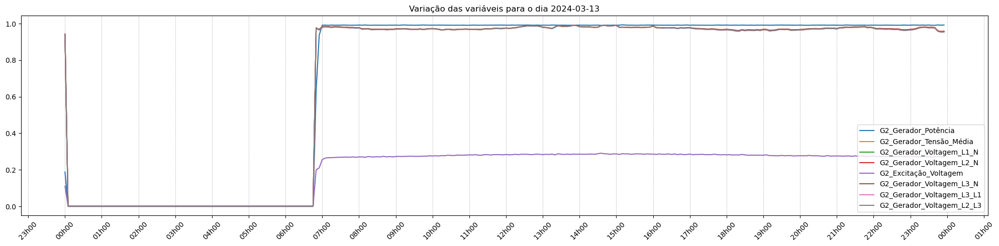

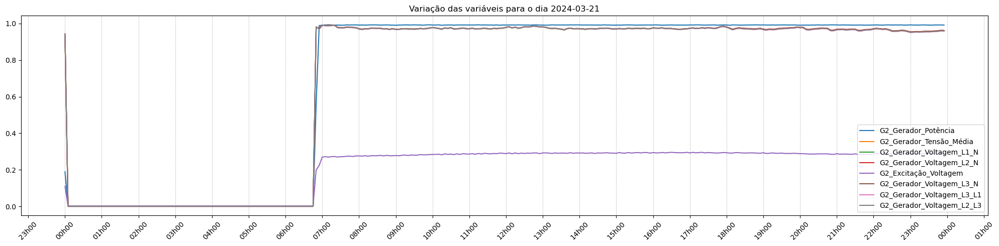

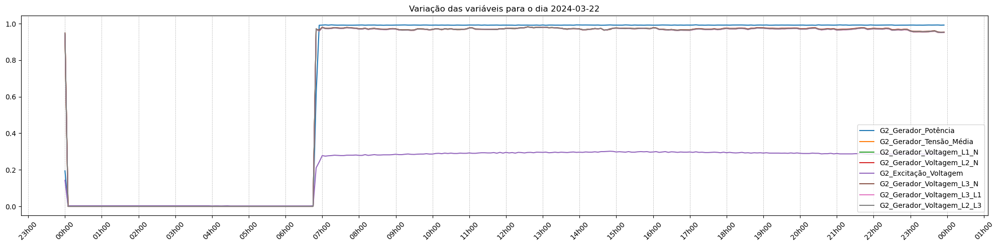

In [56]:
# Lista das datas de interesse
dates_of_interest = ['2024-03-05', '2024-03-06', '2024-03-12', '2024-03-13', '2024-03-21', '2024-03-22']

# Lista das colunas de interesse
columns_of_interest = ['G2_Gerador_Potência', 'G2_Gerador_Tensão_Média', 'G2_Gerador_Voltagem_L1_N', 'G2_Gerador_Voltagem_L2_N', 'G2_Excitação_Voltagem', 'G2_Gerador_Voltagem_L3_N', 'G2_Gerador_Voltagem_L3_L1', 
                       'G2_Gerador_Voltagem_L2_L3']

# Iterar sobre cada data de interesse
for date in dates_of_interest:
    # Filtrar o DataFrame para os dados do dia específico
    df_dia_especifico = df_resample_5_min.loc[date]

    # Criar a figura e os eixos
    fig, ax1 = plt.subplots(figsize=(20, 5))

    # Plotar as variáveis no mesmo eixo y
    for column in columns_of_interest:
        ax1.plot(df_dia_especifico.index, df_dia_especifico[column], label=column)

    # Adicionar título e legenda
    plt.title(f'Variação das variáveis para o dia {date}')
    ax1.legend(loc='lower right')

    # Formatar ticks do eixo x
    plt.xticks(rotation=45)
    ax1.xaxis.set_major_locator(mdates.HourLocator(interval=1))
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Hh%M'))

    # Adicionar grid na vertical a cada hora
    ax1.grid(True, which='major', axis='x', linestyle='--', linewidth=0.5)

    # Exibir o gráfico
    plt.tight_layout()
    plt.show()

### PADRÃO ANORMAL

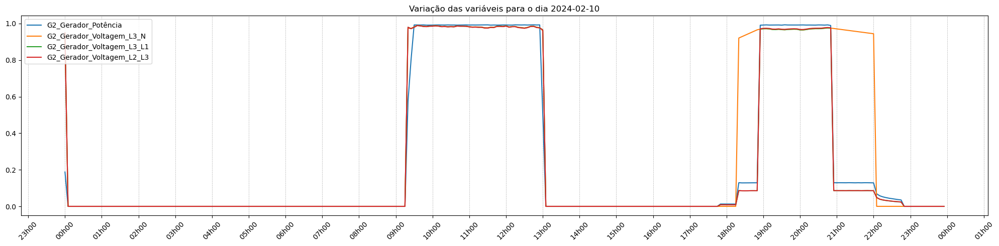

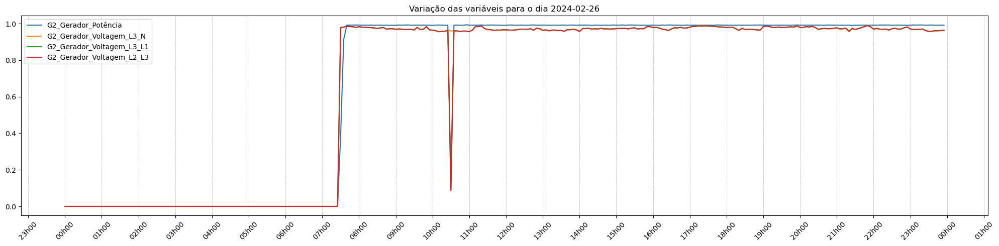

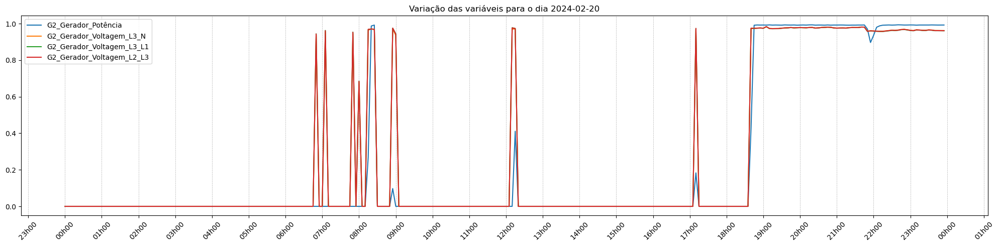

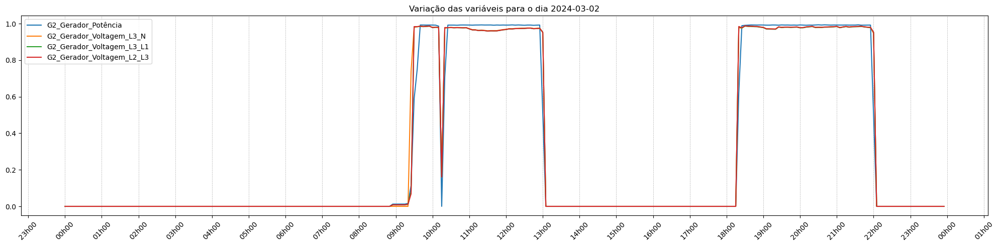

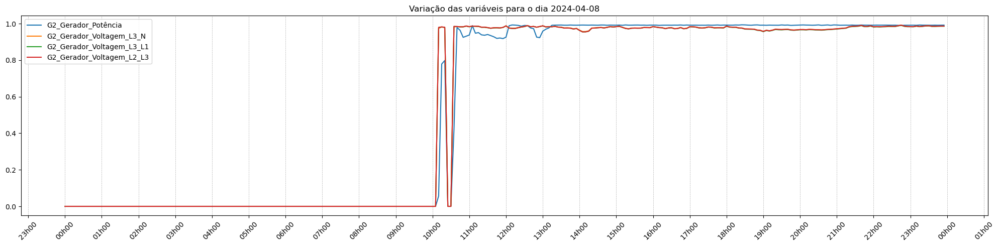

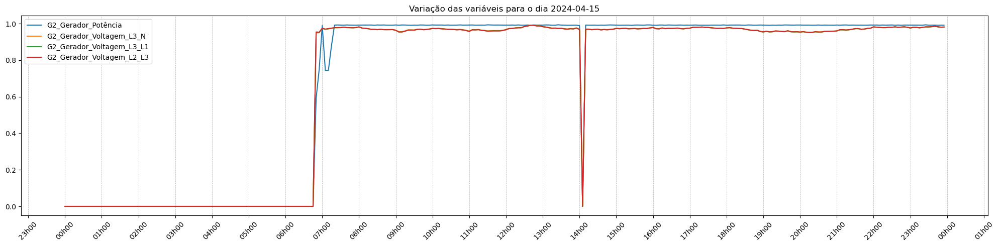

In [63]:
# Lista das datas de interesse
dates_of_interest = ['2024-02-10', '2024-02-26', '2024-02-20', '2024-03-02', '2024-04-08', '2024-04-15']

# Lista das colunas de interesse
columns_of_interest = ['G2_Gerador_Potência', 'G2_Gerador_Voltagem_L3_N', 'G2_Gerador_Voltagem_L3_L1', 
                       'G2_Gerador_Voltagem_L2_L3']

# Iterar sobre cada data de interesse
for date in dates_of_interest:
    # Filtrar o DataFrame para os dados do dia específico
    df_dia_especifico = df_resample_5_min.loc[date]

    # Criar a figura e os eixos
    fig, ax1 = plt.subplots(figsize=(20, 5))

    # Plotar as variáveis no mesmo eixo y
    for column in columns_of_interest:
        ax1.plot(df_dia_especifico.index, df_dia_especifico[column], label=column)

    # Adicionar título e legenda
    plt.title(f'Variação das variáveis para o dia {date}')
    ax1.legend(loc='upper left')

    # Formatar ticks do eixo x
    plt.xticks(rotation=45)
    ax1.xaxis.set_major_locator(mdates.HourLocator(interval=1))
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Hh%M'))

    # Adicionar grid na vertical a cada hora
    ax1.grid(True, which='major', axis='x', linestyle='--', linewidth=0.5)

    # Exibir o gráfico
    plt.tight_layout()
    plt.show()

### PADRÃO NORMAL

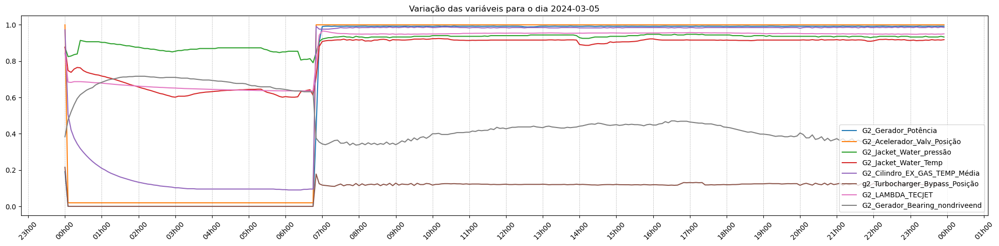

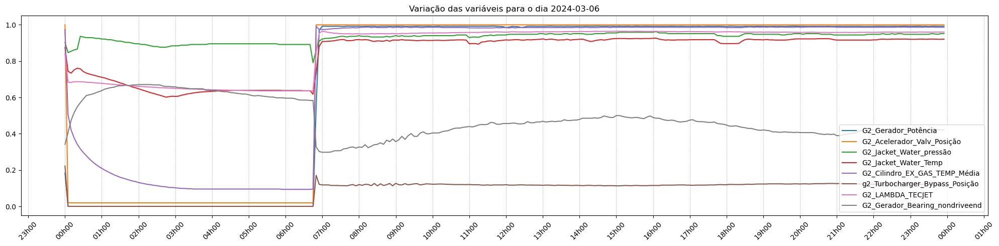

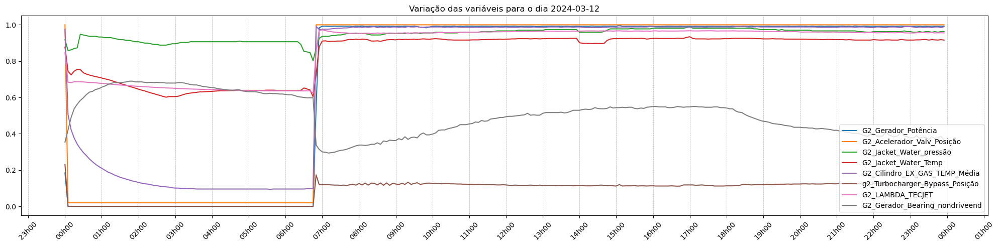

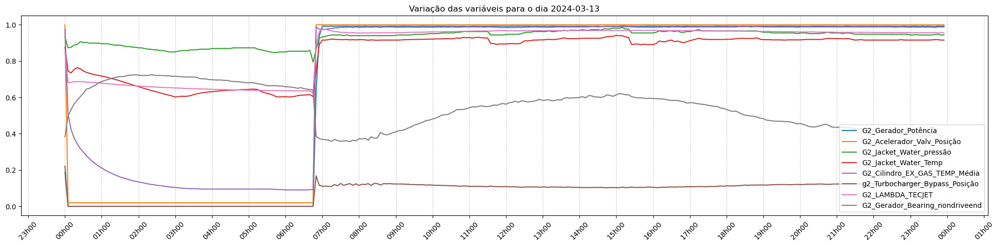

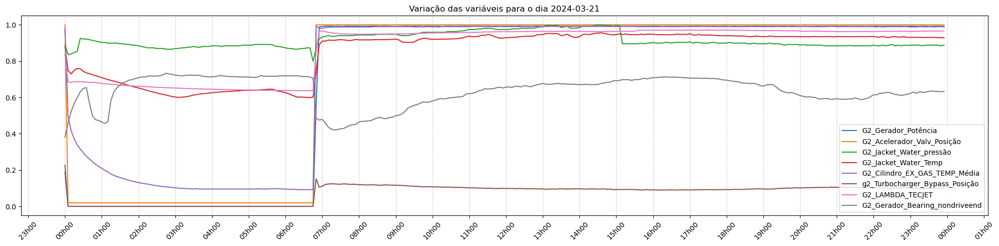

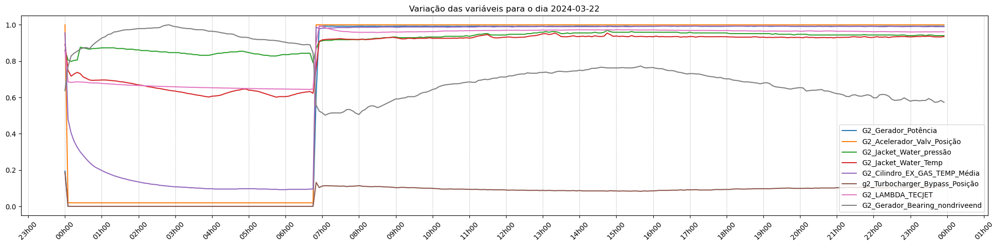

In [58]:
# Lista das datas de interesse
dates_of_interest = ['2024-03-05', '2024-03-06', '2024-03-12', '2024-03-13', '2024-03-21', '2024-03-22']

# Lista das colunas de interesse
columns_of_interest = ['G2_Gerador_Potência', 'G2_Acelerador_Valv_Posição', 'G2_Jacket_Water_pressão',
    'G2_Jacket_Water_Temp', 'G2_Cilindro_EX_GAS_TEMP_Média', 'g2_Turbocharger_Bypass_Posição', 'G2_LAMBDA_TECJET', 'G2_Gerador_Bearing_nondriveend']

# Iterar sobre cada data de interesse
for date in dates_of_interest:
    # Filtrar o DataFrame para os dados do dia específico
    df_dia_especifico = df_resample_5_min.loc[date]

    # Criar a figura e os eixos
    fig, ax1 = plt.subplots(figsize=(20, 5))

    # Plotar as variáveis no mesmo eixo y
    for column in columns_of_interest:
        ax1.plot(df_dia_especifico.index, df_dia_especifico[column], label=column)

    # Adicionar título e legenda
    plt.title(f'Variação das variáveis para o dia {date}')
    ax1.legend(loc='lower right')

    # Formatar ticks do eixo x
    plt.xticks(rotation=45)
    ax1.xaxis.set_major_locator(mdates.HourLocator(interval=1))
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Hh%M'))

    # Adicionar grid na vertical a cada hora
    ax1.grid(True, which='major', axis='x', linestyle='--', linewidth=0.5)

    # Exibir o gráfico
    plt.tight_layout()
    plt.show()

### PADRÃO ANORMAL

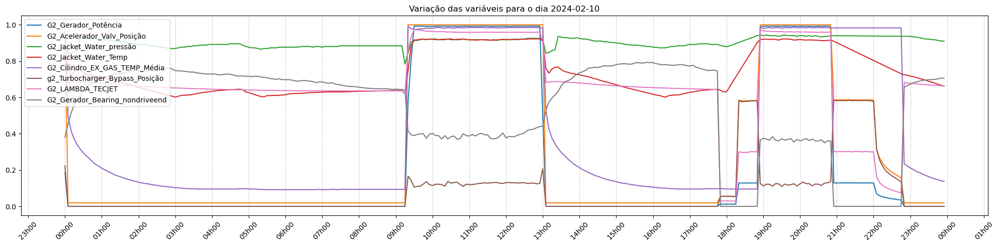

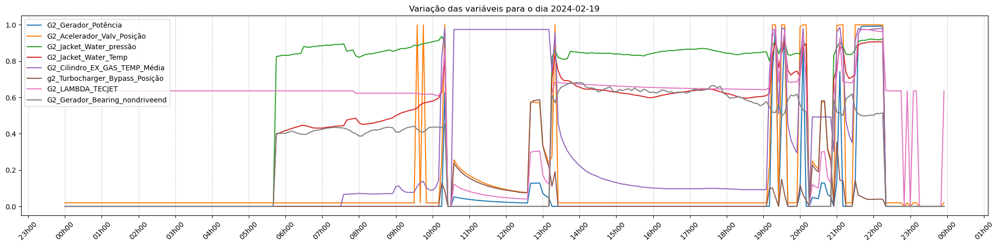

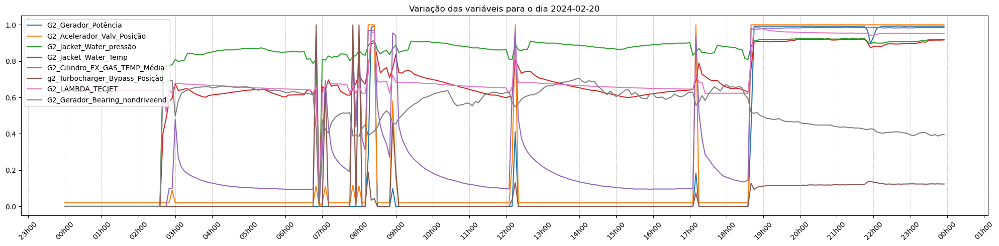

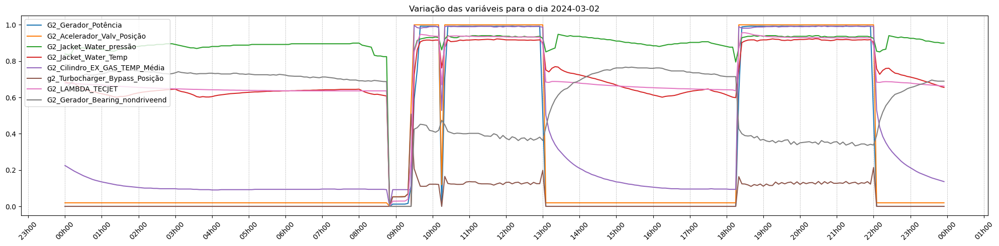

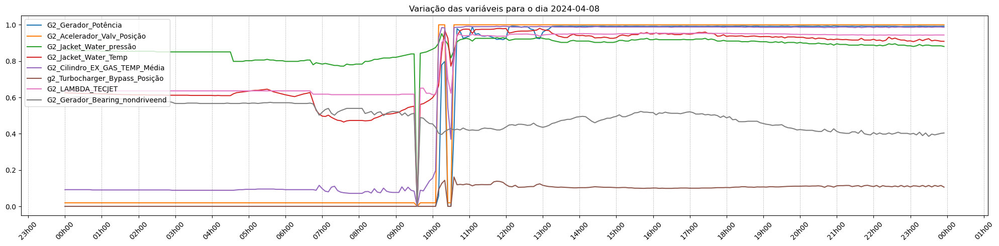

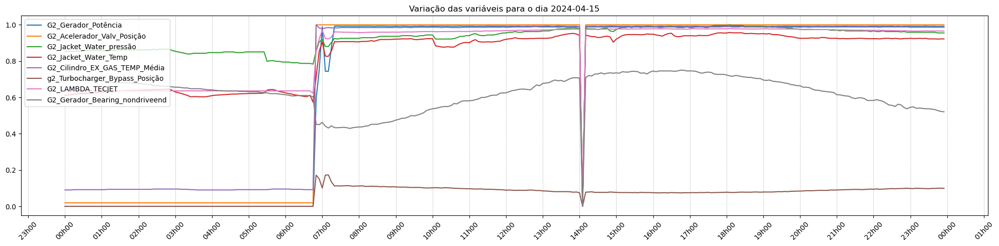

In [59]:
# Lista das datas de interesse
dates_of_interest = ['2024-02-10', '2024-02-19', '2024-02-20', '2024-03-02', '2024-04-08', '2024-04-15']

# Lista das colunas de interesse
columns_of_interest = ['G2_Gerador_Potência', 'G2_Acelerador_Valv_Posição', 'G2_Jacket_Water_pressão',
    'G2_Jacket_Water_Temp', 'G2_Cilindro_EX_GAS_TEMP_Média', 'g2_Turbocharger_Bypass_Posição', 'G2_LAMBDA_TECJET', 'G2_Gerador_Bearing_nondriveend']

# Iterar sobre cada data de interesse
for date in dates_of_interest:
    # Filtrar o DataFrame para os dados do dia específico
    df_dia_especifico = df_resample_5_min.loc[date]

    # Criar a figura e os eixos
    fig, ax1 = plt.subplots(figsize=(20, 5))

    # Plotar as variáveis no mesmo eixo y
    for column in columns_of_interest:
        ax1.plot(df_dia_especifico.index, df_dia_especifico[column], label=column)

    # Adicionar título e legenda
    plt.title(f'Variação das variáveis para o dia {date}')
    ax1.legend(loc='upper left')

    # Formatar ticks do eixo x
    plt.xticks(rotation=45)
    ax1.xaxis.set_major_locator(mdates.HourLocator(interval=1))
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Hh%M'))

    # Adicionar grid na vertical a cada hora
    ax1.grid(True, which='major', axis='x', linestyle='--', linewidth=0.5)

    # Exibir o gráfico
    plt.tight_layout()
    plt.show()

### PADRÃO NORMAL

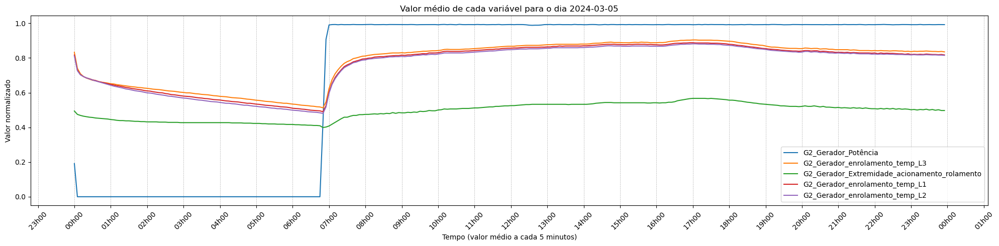

Gráfico salvo em: H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida\Variação_variáveis_ENROL_2024-03-05.png


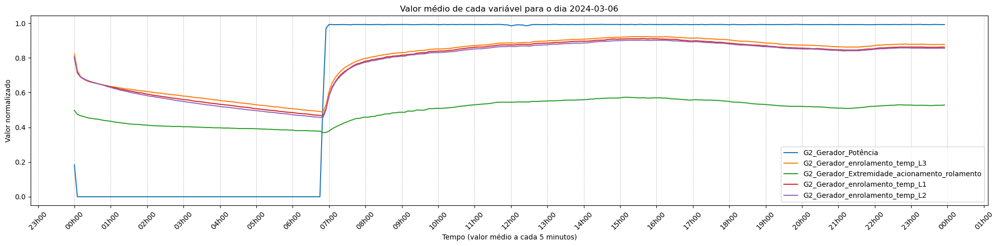

Gráfico salvo em: H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida\Variação_variáveis_ENROL_2024-03-06.png


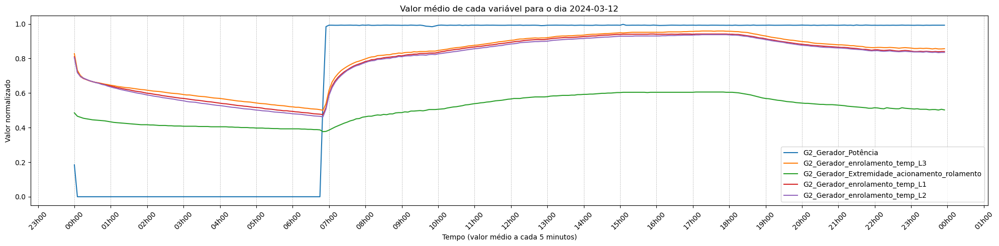

Gráfico salvo em: H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida\Variação_variáveis_ENROL_2024-03-12.png


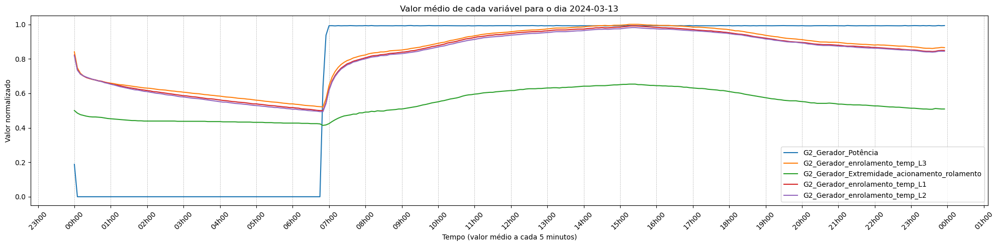

Gráfico salvo em: H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida\Variação_variáveis_ENROL_2024-03-13.png


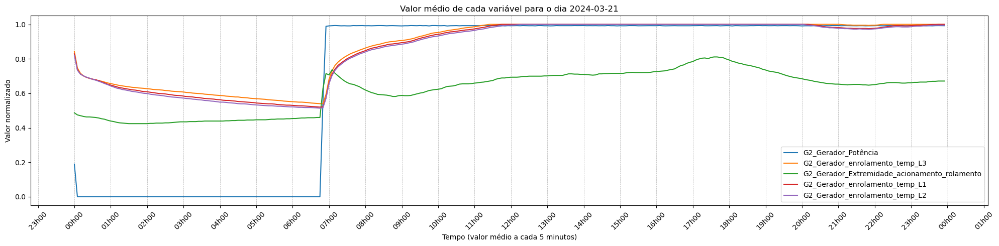

Gráfico salvo em: H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida\Variação_variáveis_ENROL_2024-03-21.png


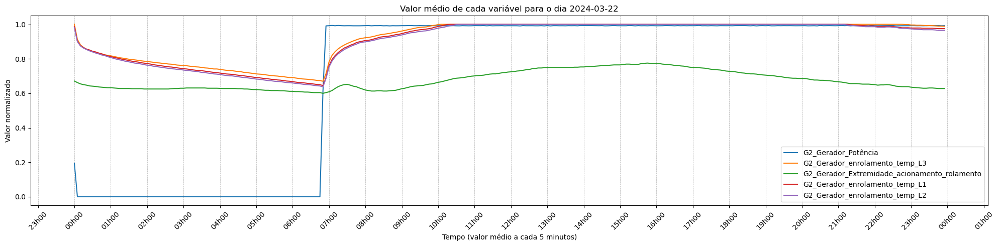

Gráfico salvo em: H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida\Variação_variáveis_ENROL_2024-03-22.png


In [20]:
# Lista das datas de interesse
dates_of_interest = ['2024-03-05', '2024-03-06', '2024-03-12', '2024-03-13', '2024-03-21', '2024-03-22']

# Lista das colunas de interesse
columns_of_interest = ['G2_Gerador_Potência', 'G2_Gerador_enrolamento_temp_L3', 'G2_Gerador_Extremidade_acionamento_rolamento', 'G2_Gerador_enrolamento_temp_L1', 'G2_Gerador_enrolamento_temp_L2']

# Diretório para salvar os gráficos
caminho_diretorio = r'H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida'

# Iterar sobre cada data de interesse
for date in dates_of_interest:
    # Filtrar o DataFrame para os dados do dia específico
    df_dia_especifico = df_resample_5_min.loc[date]

    # Criar a figura e os eixos
    fig, ax1 = plt.subplots(figsize=(20, 5))

    # Plotar as variáveis no mesmo eixo y
    for column in columns_of_interest:
        ax1.plot(df_dia_especifico.index, df_dia_especifico[column], label=column)

    # Adicionar título e legenda
    plt.title(f'Valor médio de cada variável para o dia {date}')
    ax1.legend(loc='lower right')

    # Definir rótulos dos eixos
    ax1.set_xlabel('Tempo (valor médio a cada 5 minutos)')
    ax1.set_ylabel('Valor normalizado')
    
    # Formatar ticks do eixo x
    plt.xticks(rotation=45)
    ax1.xaxis.set_major_locator(mdates.HourLocator(interval=1))
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Hh%M'))

    # Adicionar grid na vertical a cada hora
    ax1.grid(True, which='major', axis='x', linestyle='--', linewidth=0.5)

    # Ajustar o layout para melhor visualização
    plt.tight_layout()

    # Caminho para salvar o arquivo gráfico
    caminho_grafico = f'{caminho_diretorio}\\Variação_variáveis_ENROL_{date}.png'

    # Salvar o gráfico na melhor resolução possível (dpi = 300)
    plt.savefig(caminho_grafico, dpi=300)

    # Exibir o gráfico
    plt.show()

    print(f"Gráfico salvo em: {caminho_grafico}")

### PADRÃO ANORMAL

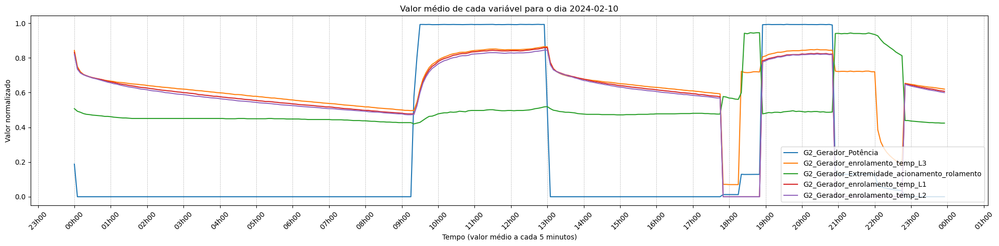

Gráfico salvo em: H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida\Variação_variáveis_ENROL_2024-02-10.png


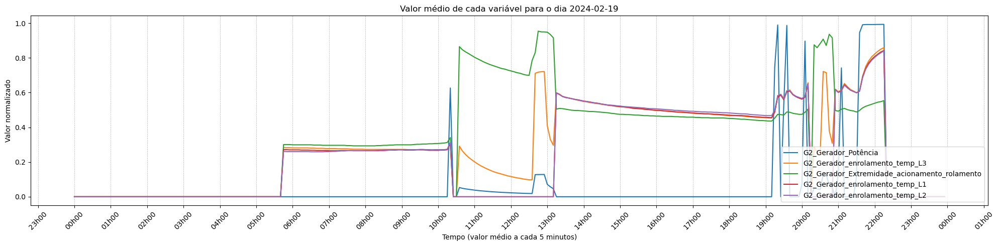

Gráfico salvo em: H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida\Variação_variáveis_ENROL_2024-02-19.png


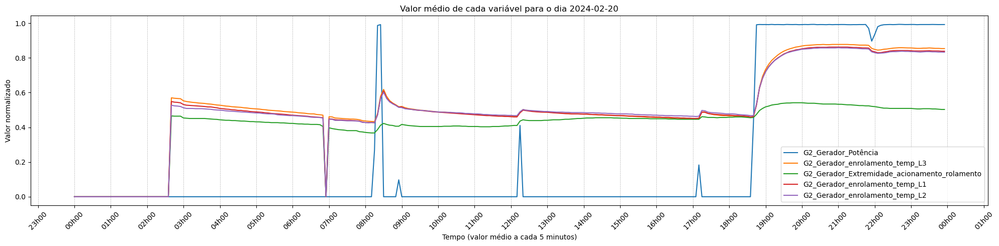

Gráfico salvo em: H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida\Variação_variáveis_ENROL_2024-02-20.png


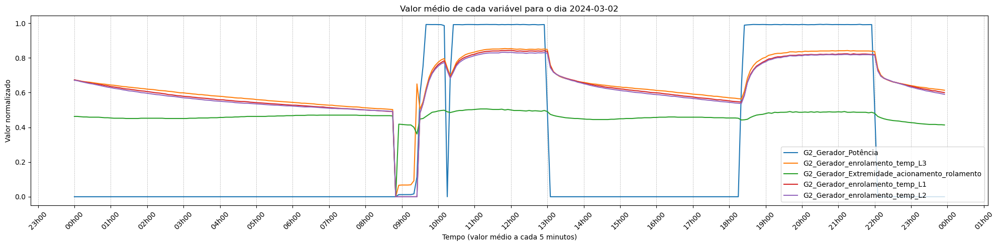

Gráfico salvo em: H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida\Variação_variáveis_ENROL_2024-03-02.png


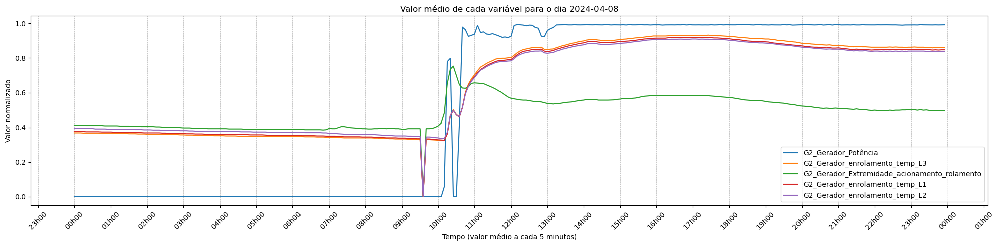

Gráfico salvo em: H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida\Variação_variáveis_ENROL_2024-04-08.png


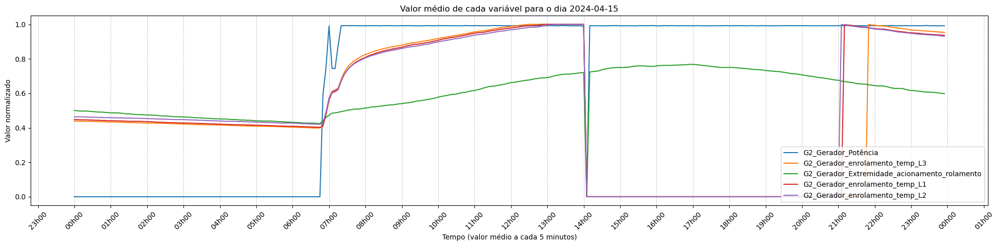

Gráfico salvo em: H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida\Variação_variáveis_ENROL_2024-04-15.png


In [21]:
# Lista das datas de interesse
dates_of_interest = ['2024-02-10', '2024-02-19', '2024-02-20', '2024-03-02', '2024-04-08', '2024-04-15']

# Lista das colunas de interesse
columns_of_interest = ['G2_Gerador_Potência', 'G2_Gerador_enrolamento_temp_L3', 'G2_Gerador_Extremidade_acionamento_rolamento', 'G2_Gerador_enrolamento_temp_L1', 'G2_Gerador_enrolamento_temp_L2']

# Diretório para salvar os gráficos
caminho_diretorio = r'H:\Path_Python\Dados_Python_2024\Lameirinho\Ficheiros_PKL_Saida'

# Iterar sobre cada data de interesse
for date in dates_of_interest:
    # Filtrar o DataFrame para os dados do dia específico
    df_dia_especifico = df_resample_5_min.loc[date]

    # Criar a figura e os eixos
    fig, ax1 = plt.subplots(figsize=(20, 5))

    # Plotar as variáveis no mesmo eixo y
    for column in columns_of_interest:
        ax1.plot(df_dia_especifico.index, df_dia_especifico[column], label=column)

    # Adicionar título e legenda
    plt.title(f'Valor médio de cada variável para o dia {date}')
    ax1.legend(loc='lower right')

    # Definir rótulos dos eixos
    ax1.set_xlabel('Tempo (valor médio a cada 5 minutos)')
    ax1.set_ylabel('Valor normalizado')
    
    # Formatar ticks do eixo x
    plt.xticks(rotation=45)
    ax1.xaxis.set_major_locator(mdates.HourLocator(interval=1))
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Hh%M'))

    # Adicionar grid na vertical a cada hora
    ax1.grid(True, which='major', axis='x', linestyle='--', linewidth=0.5)

    # Ajustar o layout para melhor visualização
    plt.tight_layout()

    # Caminho para salvar o arquivo gráfico
    caminho_grafico = f'{caminho_diretorio}\\Variação_variáveis_ENROL_{date}.png'

    # Salvar o gráfico na melhor resolução possível (dpi = 300)
    plt.savefig(caminho_grafico, dpi=300)

    # Exibir o gráfico
    plt.show()

    print(f"Gráfico salvo em: {caminho_grafico}")